# Multimodal Property Price Prediction with Satellite Imagery

In [5]:
# Multimodal Property Price Prediction with Satellite Imagery
# Combining Tabular Data + Satellite Images for Property Valuation

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import os
from pathlib import Path
import json
import warnings
warnings.filterwarnings('ignore')

# Deep Learning
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import models, transforms
import torchvision.models as models

# Machine Learning
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.decomposition import PCA
import cv2

# Advanced Models
try:
    from xgboost import XGBRegressor
    XGBOOST_AVAILABLE = True
except:
    XGBOOST_AVAILABLE = False
    print("XGBoost not available")

try:
    from lightgbm import LGBMRegressor
    LIGHTGBM_AVAILABLE = True
except:
    LIGHTGBM_AVAILABLE = False
    print("LightGBM not available")

try:
    from catboost import CatBoostRegressor
    CATBOOST_AVAILABLE = True
except:
    CATBOOST_AVAILABLE = False
    print("CatBoost not available")

# For Grad-CAM
from torch.autograd import Variable

# Set random seeds for reproducibility
np.random.seed(42)
torch.manual_seed(42)
if torch.cuda.is_available():
    torch.cuda.manual_seed(42)
    torch.backends.cudnn.deterministic = True

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")
    print(f"Memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.2f} GB")

plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")
pd.set_option('display.max_columns', None)

print("=" * 80)
print("MULTIMODAL PROPERTY VALUATION")
print("Satellite Imagery + Tabular Data")
print("=" * 80)


Using device: cuda
GPU: NVIDIA RTX 6000 Ada Generation
Memory: 51.00 GB
MULTIMODAL PROPERTY VALUATION
Satellite Imagery + Tabular Data


### 1. CONFIGURATION

In [6]:
# ============================================================================
# 1. CONFIGURATION
# ============================================================================

print("\n[1] Configuration Settings")

class Config:
    # Paths
    TRAIN_DATA_PATH = 'train.csv'
    TEST_DATA_PATH = 'test.csv'
    TRAIN_IMAGE_DIR = 'images/train'
    TEST_IMAGE_DIR = 'images/test'
    
    # Image settings
    IMAGE_SIZE = 224  # Resize to 224x224 for pre-trained models
    BATCH_SIZE = 32
    NUM_WORKERS = 6
    
    # Training settings
    EPOCHS = 20
    LEARNING_RATE = 0.001
    WEIGHT_DECAY = 1e-4
    
    # Model settings
    FEATURE_DIM = 512  # Dimension of extracted features
    
    # Save paths
    MODEL_SAVE_DIR = 'Improved models'
    RESULTS_DIR = 'Improved results'
    
    def __init__(self):
        os.makedirs(self.MODEL_SAVE_DIR, exist_ok=True)
        os.makedirs(self.RESULTS_DIR, exist_ok=True)

config = Config()
print(f"Image size: {config.IMAGE_SIZE}x{config.IMAGE_SIZE}")
print(f"Batch size: {config.BATCH_SIZE}")
print(f"Device: {device}")


[1] Configuration Settings
Image size: 224x224
Batch size: 32
Device: cuda


### 2. LOAD AND PREPARE TABULAR DATA (with Feature Engineering)

In [7]:
# ============================================================================
# 2. LOAD AND PREPARE TABULAR DATA (with Feature Engineering)
# ============================================================================

# print("\n" + "=" * 80)
# print("[2] LOADING AND ENGINEERING TABULAR DATA")
# print("=" * 80)

# def engineer_features(df, is_train=True):
#     """
#     Create new features from existing ones
#     """
#     df = df.copy()
    
#     print("Engineering features...")
    
#     # Basic Features
#     if 'bedrooms' in df.columns and 'bathrooms' in df.columns:
#         df['total_rooms'] = df['bedrooms'] + df['bathrooms']
    
#     if 'sqft_living' in df.columns and 'sqft_lot' in df.columns:
#         df['living_lot_ratio'] = df['sqft_living'] / (df['sqft_lot'] + 1)
    
#     if 'sqft_basement' in df.columns:
#         df['has_basement'] = (df['sqft_basement'] > 0).astype(int)
    
#     if 'sqft_above' in df.columns and 'sqft_living' in df.columns:
#         df['above_ratio'] = df['sqft_above'] / (df['sqft_living'] + 1)
    
#     # Neighborhood Features
#     if 'sqft_living15' in df.columns and 'sqft_living' in df.columns:
#         df['living_vs_neighbors'] = df['sqft_living'] / (df['sqft_living15'] + 1)
    
#     if 'sqft_lot15' in df.columns and 'sqft_lot' in df.columns:
#         df['lot_vs_neighbors'] = df['sqft_lot'] / (df['sqft_lot15'] + 1)
    
#     # Quality Features
#     if 'grade' in df.columns and 'condition' in df.columns:
#         df['quality_score'] = df['grade'] * df['condition']
    
#     # Age Features
#     if 'yr_built' in df.columns:
#         current_year = 2026
#         df['property_age'] = current_year - df['yr_built']
#         df['property_age'] = df['property_age'].clip(lower=0)
    
#     if 'yr_renovated' in df.columns:
#         df['was_renovated'] = (df['yr_renovated'] > 0).astype(int)
#         if 'yr_built' in df.columns:
#             df['years_since_renovation'] = current_year - df['yr_renovated']
#             df.loc[df['yr_renovated'] == 0, 'years_since_renovation'] = df['property_age']
    
#     # Location Features
#     if 'lat' in df.columns and 'long' in df.columns:
#         city_center_lat = 47.6062
#         city_center_long = -122.3321
#         df['dist_from_center'] = np.sqrt(
#             (df['lat'] - city_center_lat)**2 + 
#             (df['long'] - city_center_long)**2
#         )
    
#     # Interaction Features
#     if 'bedrooms' in df.columns and 'sqft_living' in df.columns:
#         df['sqft_per_bedroom'] = df['sqft_living'] / (df['bedrooms'] + 1)
    
#     if 'bathrooms' in df.columns and 'sqft_living' in df.columns:
#         df['sqft_per_bathroom'] = df['sqft_living'] / (df['bathrooms'] + 1)
    
#     if 'grade' in df.columns and 'sqft_living' in df.columns:
#         df['luxury_score'] = df['grade'] * np.log1p(df['sqft_living'])
    
#     if 'view' in df.columns and 'waterfront' in df.columns:
#         df['premium_view'] = df['view'] * (df['waterfront'] + 1)
    
#     return df

# # Load data
# print("\nLoading datasets...")
# train_df = pd.read_csv(config.TRAIN_DATA_PATH)
# test_df = pd.read_csv(config.TEST_DATA_PATH)

# print(f"Train shape: {train_df.shape}")
# print(f"Test shape: {test_df.shape}")

# # Apply feature engineering
# train_df = engineer_features(train_df, is_train=True)
# test_df = engineer_features(test_df, is_train=False)

train_df = pd.read_csv("train_engineered.csv", index_col=0).squeeze()
test_df = pd.read_csv("test_engineered.csv", index_col=0).squeeze()


# Handle missing values
numerical_cols = train_df.select_dtypes(include=[np.number]).columns.tolist()
cols_to_exclude = ['id', 'price']
numerical_cols = [col for col in numerical_cols if col not in cols_to_exclude]

for col in numerical_cols:
    if train_df[col].isnull().sum() > 0:
        median_val = train_df[col].median()
        train_df[col].fillna(median_val, inplace=True)
        test_df[col].fillna(median_val, inplace=True)

# Prepare features
X_tabular = train_df.drop(['price', 'id'], axis=1, errors='ignore')
y = train_df['price'].values
X_test_tabular = test_df.drop(['id'], axis=1, errors='ignore')

# Remove date columns
date_cols = X_tabular.select_dtypes(include=['datetime64']).columns.tolist()
date_cols.append('date')
print("date_cols")
print(date_cols)
X_tabular = X_tabular.drop(date_cols, axis=1, errors='ignore')
X_test_tabular = X_test_tabular.drop(date_cols, axis=1, errors='ignore')

# Ensure same columns
common_cols = list(set(X_tabular.columns) & set(X_test_tabular.columns))
X_tabular = X_tabular[common_cols]
X_test_tabular = X_test_tabular[common_cols]

print(f"\nTabular features shape: {X_tabular.shape}")
print(f"Target shape: {y.shape}")

# Split train/validation
X_tab_train, X_tab_val, y_train, y_val, train_ids, val_ids = train_test_split(
    X_tabular, y, train_df['id'], test_size=0.2, random_state=42
)

print(f"Train samples: {len(X_tab_train)}")
print(f"Validation samples: {len(X_tab_val)}")

# Scale tabular features
scaler = RobustScaler()
X_tab_train_scaled = scaler.fit_transform(X_tab_train)
X_tab_val_scaled = scaler.transform(X_tab_val)
X_test_tabular_scaled = scaler.transform(X_test_tabular)

print("Tabular data prepared successfully!")


date_cols
['date']

Tabular features shape: (16209, 37)
Target shape: (16209,)
Train samples: 12967
Validation samples: 3242
Tabular data prepared successfully!


In [8]:
print(X_tab_train.shape)
print(X_tab_train.shape[1])

(12967, 37)
37


In [9]:
X_tab_train.columns

Index(['yr_built', 'month_sold', 'total_rooms', 'bedrooms', 'sqft_lot',
       'sqft_basement', 'lat', 'sqft_per_bedroom', 'living_vs_neighbors',
       'has_basement', 'sqft_above', 'sqft_living15', 'living_lot_ratio',
       'premium_view', 'quarter_sold', 'year_sold', 'grade',
       'lot_vs_neighbors', 'floors', 'quality_score', 'was_renovated',
       'waterfront', 'zipcode', 'bathrooms', 'dist_from_center', 'sqft_lot15',
       'luxury_score', 'sqft_per_bathroom', 'view', 'age_at_sale', 'long',
       'sqft_living', 'years_since_renovation', 'yr_renovated', 'condition',
       'above_ratio', 'property_age'],
      dtype='object')

In [10]:
print(X_tab_train.head())

       yr_built  month_sold  total_rooms  bedrooms  sqft_lot  sqft_basement  \
4140       1958           7         4.00         3      6600              0   
1510       1922           8         4.00         2      3797            560   
6706       1998          11         6.50         4      7980              0   
11009      1953           5         6.25         4     11343            760   
6554       2006           7         9.25         4    320917              0   

           lat  sqft_per_bedroom  living_vs_neighbors  has_basement  \
4140   47.5297             305.0             1.108084             0   
1510   47.5596             670.0             1.210114             1   
6706   47.6378             514.0             0.930822             0   
11009  47.7117             548.0             0.981727             1   
6554   47.5605            1048.0             2.713620             0   

       sqft_above  sqft_living15  living_lot_ratio  premium_view  \
4140         1220           11

### 3. IMAGE DATA PREPARATION

In [11]:
# ============================================================================
# 3. IMAGE DATA PREPARATION
# ============================================================================

print("\n" + "=" * 80)
print("[3] IMAGE DATA PREPARATION")
print("=" * 80)

# Check image availability
print("\nChecking image files...")
train_images_exist = sum([os.path.exists(f"{config.TRAIN_IMAGE_DIR}/{id}.jpg") for id in train_df['id']])
test_images_exist = sum([os.path.exists(f"{config.TEST_IMAGE_DIR}/{id}.jpg") for id in test_df['id']])

print(f"Training images found: {train_images_exist}/{len(train_df)} ({100*train_images_exist/len(train_df):.2f}%)")
print(f"Test images found: {test_images_exist}/{len(test_df)} ({100*test_images_exist/len(test_df):.2f}%)")

# Data augmentation and preprocessing
train_transform = transforms.Compose([
    transforms.Resize((config.IMAGE_SIZE, config.IMAGE_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.3),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

val_transform = transforms.Compose([
    transforms.Resize((config.IMAGE_SIZE, config.IMAGE_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

print("Image transformations configured:")
print("- Training: Augmentation enabled (flips, rotation, color jitter)")
print("- Validation/Test: Standard normalization only")

# Custom Dataset
class PropertyDataset(Dataset):
    def __init__(self, ids, tabular_features, targets, image_dir, transform=None):
        self.ids = ids.values if hasattr(ids, 'values') else ids
        self.tabular_features = tabular_features
        self.targets = targets
        self.image_dir = image_dir
        self.transform = transform
        
    def __len__(self):
        return len(self.ids)
    
    def __getitem__(self, idx):
        # Load image
        img_path = f"{self.image_dir}/{self.ids[idx]}.jpg"
        
        try:
            image = Image.open(img_path).convert('RGB')
            if self.transform:
                image = self.transform(image)
        except:
            # If image not found, create a blank image
            image = torch.zeros(3, config.IMAGE_SIZE, config.IMAGE_SIZE)
        
        # Get tabular features
        tabular = torch.FloatTensor(self.tabular_features[idx])
        
        # Get target
        target = torch.FloatTensor([self.targets[idx]])
        
        return image, tabular, target, self.ids[idx]

# Function to save datasets
def save_datasets(train_dataset, val_dataset, test_dataset, save_dir='datasets'):
    """Save datasets to disk for later reuse"""
    os.makedirs(save_dir, exist_ok=True)
    
    print(f"\nSaving datasets to {save_dir}/...")
    
    # Save dataset components
    dataset_data = {
        'train': {
            'ids': train_dataset.ids,
            'tabular_features': train_dataset.tabular_features,
            'targets': train_dataset.targets,
            'image_dir': train_dataset.image_dir
        },
        'val': {
            'ids': val_dataset.ids,
            'tabular_features': val_dataset.tabular_features,
            'targets': val_dataset.targets,
            'image_dir': val_dataset.image_dir
        },
        'test': {
            'ids': test_dataset.ids,
            'tabular_features': test_dataset.tabular_features,
            'targets': test_dataset.targets,
            'image_dir': test_dataset.image_dir
        }
    }
    
    torch.save(dataset_data, f"{save_dir}/datasets.pt")
    print(f"✓ Datasets saved successfully")

# Function to load datasets
def load_datasets(save_dir='datasets', train_transform=None, val_transform=None):
    """Load saved datasets from disk"""
    print(f"\nLoading datasets from {save_dir}/...")
    
    dataset_data = torch.load(f"{save_dir}/datasets.pt", weights_only=False)
    
    # Recreate datasets
    train_dataset = PropertyDataset(
        dataset_data['train']['ids'],
        dataset_data['train']['tabular_features'],
        dataset_data['train']['targets'],
        dataset_data['train']['image_dir'],
        train_transform
    )
    
    val_dataset = PropertyDataset(
        dataset_data['val']['ids'],
        dataset_data['val']['tabular_features'],
        dataset_data['val']['targets'],
        dataset_data['val']['image_dir'],
        val_transform
    )
    
    test_dataset = PropertyDataset(
        dataset_data['test']['ids'],
        dataset_data['test']['tabular_features'],
        dataset_data['test']['targets'],
        dataset_data['test']['image_dir'],
        val_transform
    )
    
    print(f"✓ Datasets loaded successfully")
    return train_dataset, val_dataset, test_dataset

if not os.path.exists(f"datasets/datasets.pt"):
    # Create datasets
    train_dataset = PropertyDataset(
        train_ids, X_tab_train_scaled, y_train,
        config.TRAIN_IMAGE_DIR, train_transform
    )

    val_dataset = PropertyDataset(
        val_ids, X_tab_val_scaled, y_val,
        config.TRAIN_IMAGE_DIR, val_transform
    )

    test_dataset = PropertyDataset(
        test_df['id'], X_test_tabular_scaled, np.zeros(len(test_df)),
        config.TEST_IMAGE_DIR, val_transform
    )

    # Save datasets for later reuse
    save_datasets(train_dataset, val_dataset, test_dataset)
    print("dataset saved successfully!!!")
else:
    print("dataset already exists.")
    print("Datasets ready to load")




[3] IMAGE DATA PREPARATION

Checking image files...
Training images found: 16209/16209 (100.00%)
Test images found: 5404/5404 (100.00%)
Image transformations configured:
- Training: Augmentation enabled (flips, rotation, color jitter)
- Validation/Test: Standard normalization only
dataset already exists.
Datasets ready to load


In [12]:
# ============================================================================
# TO LOAD DATASETS LATER:
# ============================================================================
train_dataset, val_dataset, test_dataset = load_datasets(
    save_dir='datasets',
    train_transform=train_transform,
    val_transform=val_transform
)
# Create dataloaders
train_loader = DataLoader(
    train_dataset, batch_size=config.BATCH_SIZE,
    shuffle=True, num_workers=config.NUM_WORKERS, pin_memory=True
)

val_loader = DataLoader(
    val_dataset, batch_size=config.BATCH_SIZE,
    shuffle=False, num_workers=config.NUM_WORKERS, pin_memory=True
)

test_loader = DataLoader(
    test_dataset, batch_size=config.BATCH_SIZE,
    shuffle=False, num_workers=config.NUM_WORKERS, pin_memory=True
)

print(f"\nDataLoaders created:")
print(f"- Train batches: {len(train_loader)}")
print(f"- Validation batches: {len(val_loader)}")
print(f"- Test batches: {len(test_loader)}")


Loading datasets from datasets/...
✓ Datasets loaded successfully

DataLoaders created:
- Train batches: 406
- Validation batches: 102
- Test batches: 169


### 4. CNN FEATURE EXTRACTORS

In [13]:
# ============================================================================
# 4. CNN FEATURE EXTRACTORS
# ============================================================================

print("\n" + "=" * 80)
print("[4] BUILDING CNN FEATURE EXTRACTORS")
print("=" * 80)

# class CNNFeatureExtractor(nn.Module):
#     """Base class for CNN feature extractors"""
#     def __init__(self, backbone_name='resnet50', pretrained=True, feature_dim=512):
#         super(CNNFeatureExtractor, self).__init__()
#         self.backbone_name = backbone_name
#         self.feature_dim = feature_dim
        
#         if backbone_name == 'resnet50':
#             backbone = models.resnet50(pretrained=pretrained)
#             self.features = nn.Sequential(*list(backbone.children())[:-1])
#             backbone_out_dim = 2048
            
#         elif backbone_name == 'efficientnet':
#             backbone = models.efficientnet_b3(pretrained=pretrained)
#             self.features = nn.Sequential(*list(backbone.children())[:-1])
#             backbone_out_dim = 1536
            
#         elif backbone_name == 'vgg16':
#             backbone = models.vgg16(pretrained=pretrained)
#             self.features = backbone.features
#             self.avgpool = nn.AdaptiveAvgPool2d((7, 7))
#             backbone_out_dim = 512 * 7 * 7
        
#         # Projection layer to reduce dimensions
#         self.projection = nn.Sequential(
#             nn.Linear(backbone_out_dim, feature_dim),
#             nn.ReLU(),
#             nn.Dropout(0.3)
#         )
        
#     def forward(self, x):
#         x = self.features(x)
        
#         if self.backbone_name == 'vgg16':
#             x = self.avgpool(x)
        
#         x = x.view(x.size(0), -1)
#         x = self.projection(x)
#         return x

# print("Creating CNN architectures...")
# print("1. ResNet50")
# print("2. EfficientNet-B3")
# print("3. VGG16")

# ============================================================================
# PROBLEM 2: MODEL IS LEARNING IMAGE ARTIFACTS
# ============================================================================

class SpatialAttention(nn.Module):
    """Forces model to attend to spatial regions properly"""
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(2, 1, kernel_size=7, padding=3, bias=False)
        self.sigmoid = nn.Sigmoid()
        
    def forward(self, x):
        # Channel-wise statistics
        avg_out = torch.mean(x, dim=1, keepdim=True)
        max_out, _ = torch.max(x, dim=1, keepdim=True)
        combined = torch.cat([avg_out, max_out], dim=1)
        
        # Generate attention map
        attention = self.sigmoid(self.conv1(combined))
        return x * attention, attention

class ChannelAttention(nn.Module):
    """Focuses on important feature channels"""
    def __init__(self, in_channels, reduction=16):
        super().__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.max_pool = nn.AdaptiveMaxPool2d(1)
        
        self.fc = nn.Sequential(
            nn.Conv2d(in_channels, in_channels // reduction, 1, bias=False),
            nn.ReLU(),
            nn.Conv2d(in_channels // reduction, in_channels, 1, bias=False)
        )
        self.sigmoid = nn.Sigmoid()
        
    def forward(self, x):
        avg_out = self.fc(self.avg_pool(x))
        max_out = self.fc(self.max_pool(x))
        attention = self.sigmoid(avg_out + max_out)
        return x * attention

class CBAM(nn.Module):
    """Convolutional Block Attention Module"""
    def __init__(self, in_channels, reduction=16):
        super().__init__()
        self.channel_attention = ChannelAttention(in_channels, reduction)
        self.spatial_attention = SpatialAttention()
        
    def forward(self, x):
        x = self.channel_attention(x)
        x, spatial_attn = self.spatial_attention(x)
        return x, spatial_attn

class ImprovedCNNExtractor(nn.Module):
    """CNN with attention mechanisms to prevent artifact learning"""
    def __init__(self, backbone_name='resnet50', pretrained=True, feature_dim=512):
        super().__init__()
        self.backbone_name = backbone_name
        
        if backbone_name == 'resnet50':
            backbone = models.resnet50(pretrained=pretrained)
            # Get all layers except final FC and avgpool
            self.features = nn.Sequential(*list(backbone.children())[:-2])
            backbone_channels = 2048
            
        elif backbone_name == 'efficientnet':
            backbone = models.efficientnet_b3(pretrained=pretrained)
            self.features = backbone.features
            backbone_channels = 1536
            
        elif backbone_name == 'vgg16':
            backbone = models.vgg16(pretrained=pretrained)
            self.features = backbone.features
            backbone_channels = 512
        
        # Add CBAM attention
        self.attention = CBAM(backbone_channels)
        
        # Global pooling
        self.avgpool = nn.AdaptiveAvgPool2d(1)
        
        # Projection head
        self.projection = nn.Sequential(
            nn.Linear(backbone_channels, feature_dim),
            nn.BatchNorm1d(feature_dim),
            nn.ReLU(),
            nn.Dropout(0.3)
        )
        
    def forward(self, x, return_attention=False):
        # Extract features
        features = self.features(x)
        
        # Apply attention
        attended_features, spatial_attention = self.attention(features)
        
        # Pool
        pooled = self.avgpool(attended_features)
        pooled = pooled.view(pooled.size(0), -1)
        
        # Project
        output = self.projection(pooled)
        
        if return_attention:
            return output, spatial_attention
        return output

print("Creating Improved CNN architectures...")
print("1. ResNet50")
print("2. EfficientNet-B3")
print("3. VGG16")


[4] BUILDING CNN FEATURE EXTRACTORS
Creating Improved CNN architectures...
1. ResNet50
2. EfficientNet-B3
3. VGG16


### 5. MULTIMODAL FUSION ARCHITECTURES

#### 5.1 Early Fusion

In [14]:
# ============================================================================
# 5. MULTIMODAL FUSION ARCHITECTURES
# ============================================================================

print("\n" + "=" * 80)
print("[5] MULTIMODAL FUSION ARCHITECTURES")
print("=" * 80)

# 5.1 Early Fusion
# class EarlyFusionModel(nn.Module):
#     """Concatenate image and tabular features early, then predict"""
#     def __init__(self, cnn_backbone, tabular_dim, feature_dim=512):
#         super(EarlyFusionModel, self).__init__()
#         self.cnn = CNNFeatureExtractor(cnn_backbone, pretrained=True, feature_dim=feature_dim)
#         self.tabular_dim = tabular_dim
        
#         # Combined feature processing
#         combined_dim = feature_dim + tabular_dim
#         self.fusion = nn.Sequential(
#             nn.Linear(combined_dim, 512),
#             nn.ReLU(),
#             nn.Dropout(0.3),
#             nn.Linear(512, 256),
#             nn.ReLU(),
#             nn.Dropout(0.2),
#             nn.Linear(256, 128),
#             nn.ReLU(),
#             nn.Linear(128, 1)
#         )
        
#     def forward(self, image, tabular):
#         # Extract image features
#         img_features = self.cnn(image)
        
#         # Concatenate
#         combined = torch.cat([img_features, tabular], dim=1)
        
#         # Predict
#         output = self.fusion(combined)
#         return output

# print("✓ Early Fusion Architecture")

class ImprovedEarlyFusion(nn.Module):
    """Early fusion with attention mechanisms and better feature processing"""
    def __init__(self, cnn_backbone, tabular_dim, feature_dim=512):
        super().__init__()
        
        # Image encoder with attention
        self.cnn = ImprovedCNNExtractor(cnn_backbone, pretrained=True, feature_dim=feature_dim)
        
        # Tabular encoder - normalize to same dimension as image features
        self.tabular_encoder = nn.Sequential(
            nn.Linear(tabular_dim, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(256, feature_dim),
            nn.BatchNorm1d(feature_dim),
            nn.ReLU(),
            nn.Dropout(0.2)
        )
        
        # Cross-modal attention for weighted fusion
        self.cross_attention = nn.MultiheadAttention(
            embed_dim=feature_dim,
            num_heads=8,
            dropout=0.1,
            batch_first=True
        )
        
        # Combined feature processing with batch normalization
        combined_dim = feature_dim * 2  # Both features normalized to feature_dim
        self.fusion = nn.Sequential(
            nn.Linear(combined_dim, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(512, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(256, 128),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(128, 1)
        )
        
    def forward(self, image, tabular, return_attention=False):
        # Extract image features with spatial attention
        img_features, spatial_attn = self.cnn(image, return_attention=True)
        
        # Encode tabular features to same dimension
        tab_features = self.tabular_encoder(tabular)
        
        # Apply cross-modal attention (optional refinement)
        # Query: image, Key/Value: tabular
        img_refined, cross_attn = self.cross_attention(
            img_features.unsqueeze(1),
            tab_features.unsqueeze(1),
            tab_features.unsqueeze(1)
        )
        img_refined = img_refined.squeeze(1)
        
        # Early concatenation of refined features
        combined = torch.cat([img_refined, tab_features], dim=1)
        
        # Predict
        output = self.fusion(combined)
        
        if return_attention:
            return output, {'spatial': spatial_attn, 'cross_modal': cross_attn}
        return output
    
print("✓ Improved Early Fusion Architecture")


[5] MULTIMODAL FUSION ARCHITECTURES
✓ Improved Early Fusion Architecture


#### 5.2 Late Fusion

In [15]:
# 5.2 Late Fusion
# class LateFusionModel(nn.Module):
#     """Train separate branches for image and tabular, combine predictions"""
#     def __init__(self, cnn_backbone, tabular_dim, feature_dim=512):
#         super(LateFusionModel, self).__init__()
#         self.cnn = CNNFeatureExtractor(cnn_backbone, pretrained=True, feature_dim=feature_dim)
        
#         # Image branch
#         self.image_branch = nn.Sequential(
#             nn.Linear(feature_dim, 256),
#             nn.ReLU(),
#             nn.Dropout(0.3),
#             nn.Linear(256, 128),
#             nn.ReLU(),
#             nn.Linear(128, 1)
#         )
        
#         # Tabular branch
#         self.tabular_branch = nn.Sequential(
#             nn.Linear(tabular_dim, 256),
#             nn.ReLU(),
#             nn.Dropout(0.3),
#             nn.Linear(256, 128),
#             nn.ReLU(),
#             nn.Linear(128, 1)
#         )
        
#         # Fusion weights (learnable)
#         self.alpha = nn.Parameter(torch.tensor(0.5))
        
#     def forward(self, image, tabular):
#         # Extract image features
#         img_features = self.cnn(image)
        
#         # Get predictions from each branch
#         img_pred = self.image_branch(img_features)
#         tab_pred = self.tabular_branch(tabular)
        
#         # Weighted combination
#         alpha = torch.sigmoid(self.alpha)
#         output = alpha * img_pred + (1 - alpha) * tab_pred
        
#         return output

# print("✓ Late Fusion Architecture")

class ImprovedLateFusion(nn.Module):
    """Late fusion with attention mechanisms and sophisticated branch fusion"""
    def __init__(self, cnn_backbone, tabular_dim, feature_dim=512):
        super().__init__()
        
        # Image encoder with attention
        self.cnn = ImprovedCNNExtractor(cnn_backbone, pretrained=True, feature_dim=feature_dim)
        
        # Image branch with batch normalization
        self.image_branch = nn.Sequential(
            nn.Linear(feature_dim, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(256, 128),
            nn.BatchNorm1d(128),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(128, 64),
            nn.ReLU()
        )
        
        # Tabular branch with deeper processing
        self.tabular_branch = nn.Sequential(
            nn.Linear(tabular_dim, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(256, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(256, 128),
            nn.BatchNorm1d(128),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(128, 64),
            nn.ReLU()
        )
        
        # Gating mechanism for adaptive fusion
        self.gate_network = nn.Sequential(
            nn.Linear(64 + 64, 64),
            nn.ReLU(),
            nn.Linear(64, 2),
            nn.Softmax(dim=1)
        )
        
        # Final prediction head
        self.prediction_head = nn.Sequential(
            nn.Linear(64, 32),
            nn.ReLU(),
            nn.Dropout(0.1),
            nn.Linear(32, 1)
        )
        
        # Learnable fusion weights (as backup to gating)
        self.alpha = nn.Parameter(torch.tensor(0.5))
        
    def forward(self, image, tabular, return_attention=False, use_gating=True):
        # Extract image features with spatial attention
        img_features, spatial_attn = self.cnn(image, return_attention=True)
        
        # Process through separate branches
        img_branch_out = self.image_branch(img_features)
        tab_branch_out = self.tabular_branch(tabular)
        
        if use_gating:
            # Adaptive gating mechanism
            combined_for_gate = torch.cat([img_branch_out, tab_branch_out], dim=1)
            gate_weights = self.gate_network(combined_for_gate)
            
            # Weighted fusion using learned gates
            fused = (gate_weights[:, 0:1] * img_branch_out + 
                     gate_weights[:, 1:2] * tab_branch_out)
        else:
            # Simple weighted combination using alpha
            alpha = torch.sigmoid(self.alpha)
            fused = alpha * img_branch_out + (1 - alpha) * tab_branch_out
        
        # Final prediction
        output = self.prediction_head(fused)
        
        if return_attention:
            attention_info = {
                'spatial': spatial_attn,
                'gate_weights': gate_weights if use_gating else None,
                'alpha': torch.sigmoid(self.alpha)
            }
            return output, attention_info
        return output

print("✓ Improved Late Fusion Architecture")

✓ Improved Late Fusion Architecture


#### 5.3 Hybrid Fusion

In [16]:
# 5.3 Hybrid Fusion
# class HybridFusionModel(nn.Module):
#     """Multiple fusion points - combines early and late fusion"""
#     def __init__(self, cnn_backbone, tabular_dim, feature_dim=512):
#         super(HybridFusionModel, self).__init__()
#         self.cnn = CNNFeatureExtractor(cnn_backbone, pretrained=True, feature_dim=feature_dim)
        
#         # Tabular processing
#         self.tabular_encoder = nn.Sequential(
#             nn.Linear(tabular_dim, 256),
#             nn.ReLU(),
#             nn.Dropout(0.2)
#         )
        
#         # Early fusion path
#         self.early_fusion = nn.Sequential(
#             nn.Linear(feature_dim + 256, 384),
#             nn.ReLU(),
#             nn.Dropout(0.3)
#         )
        
#         # Late fusion paths
#         self.image_path = nn.Sequential(
#             nn.Linear(feature_dim, 192),
#             nn.ReLU(),
#             nn.Dropout(0.2)
#         )
        
#         self.tabular_path = nn.Sequential(
#             nn.Linear(256, 192),
#             nn.ReLU(),
#             nn.Dropout(0.2)
#         )
        
#         # Final prediction
#         self.final_fusion = nn.Sequential(
#             nn.Linear(384 + 192 + 192, 256),
#             nn.ReLU(),
#             nn.Dropout(0.2),
#             nn.Linear(256, 128),
#             nn.ReLU(),
#             nn.Linear(128, 1)
#         )
        
#     def forward(self, image, tabular):
#         # Extract features
#         img_features = self.cnn(image)
#         tab_features = self.tabular_encoder(tabular)
        
#         # Early fusion
#         early = self.early_fusion(torch.cat([img_features, tab_features], dim=1))
        
#         # Late fusion
#         img_path = self.image_path(img_features)
#         tab_path = self.tabular_path(tab_features)
        
#         # Combine all paths
#         combined = torch.cat([early, img_path, tab_path], dim=1)
#         output = self.final_fusion(combined)
        
#         return output

# print("✓ Hybrid Fusion Architecture")

class ImprovedHybridFusion(nn.Module):
    """Hybrid fusion with proper attention mechanisms"""
    def __init__(self, cnn_backbone, tabular_dim, feature_dim=512):
        super().__init__()
        
        # Image encoder with attention
        self.cnn = ImprovedCNNExtractor(cnn_backbone, pretrained=True, feature_dim=feature_dim)
        
        # Tabular encoder
        self.tabular_encoder = nn.Sequential(
            nn.Linear(tabular_dim, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(256, feature_dim),
            nn.BatchNorm1d(feature_dim),
            nn.ReLU(),
            nn.Dropout(0.2)
        )
        
        # Early fusion path
        self.early_fusion = nn.Sequential(
            nn.Linear(feature_dim * 2, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(),
            nn.Dropout(0.3)
        )
        
        # Image-only path
        self.image_path = nn.Sequential(
            nn.Linear(feature_dim, 256),
            nn.ReLU(),
            nn.Dropout(0.2)
        )
        
        # Tabular-only path  
        self.tabular_path = nn.Sequential(
            nn.Linear(feature_dim, 256),
            nn.ReLU(),
            nn.Dropout(0.2)
        )
        
        # Final fusion
        self.final = nn.Sequential(
            nn.Linear(512 + 256 + 256, 384),
            nn.BatchNorm1d(384),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(384, 128),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(128, 1)
        )
        
    def forward(self, image, tabular, return_attention=False):
        # Extract features
        img_features, spatial_attn = self.cnn(image, return_attention=True)
        tab_features = self.tabular_encoder(tabular)
        
        # Early fusion
        early = self.early_fusion(torch.cat([img_features, tab_features], dim=1))
        
        # Late fusion
        img_path = self.image_path(img_features)
        tab_path = self.tabular_path(tab_features)
        
        # Combine all
        combined = torch.cat([early, img_path, tab_path], dim=1)
        output = self.final(combined)
        
        if return_attention:
            return output, spatial_attn
        return output

print("✓ Improved Hybrid Fusion Architecture")

✓ Improved Hybrid Fusion Architecture


### 6. TRAINING UTILITIES

In [17]:
# ============================================================================
# 6. TRAINING UTILITIES
# ============================================================================

print("\n" + "=" * 80)
print("[6] TRAINING UTILITIES")
print("=" * 80)

class EarlyStopping:
    """Early stopping to prevent overfitting"""
    def __init__(self, patience=5, min_delta=0):
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_loss = None
        self.early_stop = False
        
    def __call__(self, val_loss):
        if self.best_loss is None:
            self.best_loss = val_loss
        elif val_loss > self.best_loss - self.min_delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_loss = val_loss
            self.counter = 0

def train_epoch(model, loader, criterion, optimizer, device):
    """Train for one epoch"""
    model.train()
    total_loss = 0
    
    for images, tabular, targets, _ in loader:
        images = images.to(device)
        tabular = tabular.to(device)
        targets = targets.to(device)
        
        # Forward pass
        outputs = model(images, tabular)
        loss = criterion(outputs, targets)
        
        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        total_loss += loss.item()
    
    return total_loss / len(loader)

def validate(model, loader, criterion, device):
    """Validate the model"""
    model.eval()
    total_loss = 0
    predictions = []
    actuals = []
    
    with torch.no_grad():
        for images, tabular, targets, _ in loader:
            images = images.to(device)
            tabular = tabular.to(device)
            targets = targets.to(device)
            
            outputs = model(images, tabular)
            loss = criterion(outputs, targets)
            
            total_loss += loss.item()
            predictions.extend(outputs.cpu().numpy())
            actuals.extend(targets.cpu().numpy())
    
    predictions = np.array(predictions).flatten()
    actuals = np.array(actuals).flatten()
    
    rmse = np.sqrt(mean_squared_error(actuals, predictions))
    mae = mean_absolute_error(actuals, predictions)
    r2 = r2_score(actuals, predictions)
    
    return total_loss / len(loader), rmse, mae, r2, predictions, actuals

# def train_model(model, train_loader, val_loader, epochs, lr, device, model_name):
#     """Complete training loop"""
#     print(f"\n{'='*60}")
#     print(f"Training: {model_name}")
#     print(f"{'='*60}")
    
#     criterion = nn.MSELoss()
#     optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=config.WEIGHT_DECAY)
#     scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=3, factor=0.5)
#     early_stopping = EarlyStopping(patience=5)
    
#     history = {
#         'train_loss': [],
#         'val_loss': [],
#         'val_rmse': [],
#         'val_mae': [],
#         'val_r2': []
#     }
    
#     best_rmse = float('inf')
    
#     for epoch in range(epochs):
#         # Train
#         train_loss = train_epoch(model, train_loader, criterion, optimizer, device)
        
#         # Validate
#         val_loss, val_rmse, val_mae, val_r2, _, _ = validate(model, val_loader, criterion, device)
        
#         # Update scheduler
#         scheduler.step(val_loss)
        
#         # Save history
#         history['train_loss'].append(train_loss)
#         history['val_loss'].append(val_loss)
#         history['val_rmse'].append(val_rmse)
#         history['val_mae'].append(val_mae)
#         history['val_r2'].append(val_r2)
        
#         print(f"Epoch {epoch+1}/{epochs}")
#         print(f"  Train Loss: {train_loss:.4f}")
#         print(f"  Val Loss: {val_loss:.4f} | RMSE: ${val_rmse:,.2f} | MAE: ${val_mae:,.2f} | R²: {val_r2:.4f}")
        
#         # Save best model
#         if val_rmse < best_rmse:
#             best_rmse = val_rmse
#             torch.save(model.state_dict(), f"{config.MODEL_SAVE_DIR}/{model_name}_best.pth")
#             print(f"  ✓ Saved best model (RMSE: ${best_rmse:,.2f})")
        
#         # Early stopping
#         early_stopping(val_loss)
#         if early_stopping.early_stop:
#             print(f"  Early stopping triggered at epoch {epoch+1}")
#             break
    
#     # Load best model
#     model.load_state_dict(torch.load(f"{config.MODEL_SAVE_DIR}/{model_name}_best.pth"))
    
#     return model, history

# ============================================================================
# PROBLEM 3: ADD CENTER-FOCUSED LOSS
# ============================================================================

def center_attention_loss(attention_map, weight=0.1):
    """
    Encourages model to attend to center region
    attention_map: [B, 1, H, W]
    """

    # Handle dictionary input
    if isinstance(attention_map, dict):
        attention_map = attention_map.get('spatial')
        if attention_map is None:
            return torch.tensor(0.0)
    else:
        attention_map = attention_map
    
    # Handle None case
    if attention_map is None:
        return torch.tensor(0.0)
    B, C, H, W = attention_map.shape
    
    # Create center mask (middle 50% of image)
    center_mask = torch.zeros_like(attention_map)
    h_start, h_end = H // 4, 3 * H // 4
    w_start, w_end = W // 4, 3 * W // 4
    center_mask[:, :, h_start:h_end, w_start:w_end] = 1.0
    
    # Center attention score
    center_attention = torch.sum(attention_map * center_mask) / (torch.sum(center_mask) + 1e-8)
    
    # Border attention score
    border_mask = 1.0 - center_mask
    border_attention = torch.sum(attention_map * border_mask) / (torch.sum(border_mask) + 1e-8)
    
    # We want center > border
    loss = weight * torch.relu(border_attention - center_attention)
    
    return loss

# ============================================================================
# IMPROVED TRAINING LOOP WITH CENTER LOSS
# ============================================================================

def train_with_attention_loss(model, train_loader, val_loader, epochs, lr, device, model_name):
    """Training loop with center attention loss"""
    print(f"\n{'='*60}")
    print(f"Training: {model_name} (with attention loss)")
    print(f"{'='*60}")
    
    mse_criterion = nn.MSELoss()
    optimizer = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-4)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(optimizer, T_0=10, T_mult=2)
    
    best_rmse = float('inf')
    patience = 5
    patience_counter = 0
    
    history = {
        'train_loss': [],
        'train_mse_loss': [],
        'train_attn_loss': [],
        'val_rmse': [],
        'val_r2': []
    }
    
    for epoch in range(epochs):
        # Training
        model.train()
        train_loss = 0
        train_mse_loss = 0
        train_attn_loss = 0
        
        for images, tabular, targets, _ in train_loader:
            images = images.to(device)
            tabular = tabular.to(device)
            targets = targets.to(device)
            
            optimizer.zero_grad()
            
            # Forward pass with attention
            outputs, attention_info = model(images, tabular, return_attention=True)
            
            # MSE loss
            mse_loss = mse_criterion(outputs, targets)
            
            # Extract spatial attention from the attention_info
            if isinstance(attention_info, dict):
                spatial_attn = attention_info.get('spatial')
            else:
                spatial_attn = attention_info
            
            # Center attention loss (only if spatial attention exists)
            if spatial_attn is not None:
                attn_loss = center_attention_loss(spatial_attn, weight=0.05)
            else:
                attn_loss = 0
            
            # Total loss
            total_loss = mse_loss + attn_loss
            
            # Backward
            total_loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            optimizer.step()
            
            train_loss += total_loss.item()
            train_mse_loss += mse_loss.item()
            train_attn_loss += attn_loss.item()
        
        # Validation
        model.eval()
        val_preds = []
        val_targets = []
        
        with torch.no_grad():
            for images, tabular, targets, _ in val_loader:
                images = images.to(device)
                tabular = tabular.to(device)
                
                outputs = model(images, tabular, return_attention=False)
                
                val_preds.extend(outputs.cpu().numpy())
                val_targets.extend(targets.numpy())
        
        val_preds = np.array(val_preds).flatten()
        val_targets = np.array(val_targets).flatten()
        
        val_rmse = np.sqrt(mean_squared_error(val_targets, val_preds))
        val_r2 = r2_score(val_targets, val_preds)
        
        # Learning rate schedule
        scheduler.step()
        
        # Save history
        history['train_loss'].append(train_loss / len(train_loader))
        history['train_mse_loss'].append(train_mse_loss / len(train_loader))
        history['train_attn_loss'].append(train_attn_loss / len(train_loader))
        history['val_rmse'].append(val_rmse)
        history['val_r2'].append(val_r2)
        
        print(f"Epoch {epoch+1}/{epochs}")
        print(f"  Train Loss: {train_loss/len(train_loader):.4f} (MSE: {train_mse_loss/len(train_loader):.4f}, Attn: {train_attn_loss/len(train_loader):.6f})")
        print(f"  Val RMSE: ${val_rmse:,.2f} | R²: {val_r2:.4f}")
        
        # Save best model
        if val_rmse < best_rmse:
            best_rmse = val_rmse
            torch.save(model.state_dict(), f'Improved models/{model_name}_best.pth')
            print(f"  ✓ Saved best model (RMSE: ${best_rmse:,.2f})")

            with open(f"Improved models/{model_name}_best.json", "w") as f:
                json.dump(history, f, indent=4)
            patience_counter = 0
        else:
            patience_counter += 1
        
        # Early stopping
        if patience_counter >= patience:
            print(f"  Early stopping at epoch {epoch+1}")
            break
    
    # Load best model
    model.load_state_dict(torch.load(f'{config.MODEL_SAVE_DIR}/{model_name}_best.pth'))
    with open(f"Improved models/{model_name}_best.json", "r") as f:
        history = json.load(f)
    return model, history

print("Training utilities configured:")
print("- Early stopping (patience=5)")
print("- Learning rate scheduler")
print("- MSE Loss function")
print("- Adam optimizer")



[6] TRAINING UTILITIES
Training utilities configured:
- Early stopping (patience=5)
- Learning rate scheduler
- MSE Loss function
- Adam optimizer


### 7. TRAIN ALL FUSION MODELS

#### 7.1 Early Fusion Models

In [18]:
# ============================================================================
# 7. TRAIN ALL FUSION MODELS
# ============================================================================

print("\n" + "=" * 80)
print("[7] TRAINING MULTIMODAL MODELS")
print("=" * 80)

tabular_dim = X_tab_train_scaled.shape[1]
all_models = {}
all_histories = {}

# 7.1 Early Fusion Models
print("\n" + "="*60)
print("EARLY FUSION MODELS")
print("="*60)

# for backbone in ['resnet50', 'efficientnet', 'vgg16']:
#     model_name = f"ImprovedEarlyFusion_{backbone}"
#     print(f"\n>>> Training {model_name}...")
    
#     model = ImprovedEarlyFusion(backbone, tabular_dim, feature_dim=config.FEATURE_DIM).to(device)
#     model, history = train_with_attention_loss(model, train_loader, val_loader, config.EPOCHS, config.LEARNING_RATE, device, model_name)
    
#     all_models[model_name] = model
#     all_histories[model_name] = history

print("Early Fusion Models trained")


[7] TRAINING MULTIMODAL MODELS

EARLY FUSION MODELS
Early Fusion Models trained


#### 7.2 Late Fusion Models

In [19]:
# 7.2 Late Fusion Models
print("\n" + "="*60)
print("LATE FUSION MODELS")
print("="*60)

# for backbone in ['resnet50', 'efficientnet', 'vgg16']:
#     model_name = f"ImprovedLateFusion_{backbone}"
#     print(f"\n>>> Training {model_name}...")
    
#     model = ImprovedLateFusion(backbone, tabular_dim, feature_dim=config.FEATURE_DIM).to(device)
#     model, history = train_with_attention_loss(model, train_loader, val_loader, config.EPOCHS, config.LEARNING_RATE, device, model_name)
    
#     all_models[model_name] = model
#     all_histories[model_name] = history



LATE FUSION MODELS


#### 7.3 Hybrid Fusion Models

In [20]:
# # 7.3 Hybrid Fusion Models
# print("\n" + "="*60)
# print("HYBRID FUSION MODELS")
# print("="*60)

# for backbone in ['resnet50', 'efficientnet', 'vgg16']:
#     model_name = f"ImprovedHybridFusion_{backbone}"
#     print(f"\n>>> Training {model_name}...")
    
#     model = ImprovedHybridFusion(backbone, tabular_dim, feature_dim=config.FEATURE_DIM).to(device)
#     model, history = train_with_attention_loss(model, train_loader, val_loader, config.EPOCHS, config.LEARNING_RATE, device, model_name)
    
#     all_models[model_name] = model
#     all_histories[model_name] = history

# print("\n" + "="*80)
# print("ALL MODELS TRAINED SUCCESSFULLY!")
# print("="*80)


### 8. MODEL EVALUATION & COMPARISON


[8] MODEL EVALUATION & COMPARISON



ImprovedEarlyFusion_vgg16:
  RMSE: $343,830.64
  MAE: $229,676.81
  R²: 0.0579

ImprovedEarlyFusion_efficientnet:
  RMSE: $309,705.30
  MAE: $225,193.09
  R²: 0.2356

ImprovedEarlyFusion_resnet50:
  RMSE: $338,090.62
  MAE: $245,113.25
  R²: 0.0891

ImprovedLateFusion_vgg16:
  RMSE: $264,973.40
  MAE: $170,094.91
  R²: 0.4405

ImprovedLateFusion_efficientnet:
  RMSE: $246,779.01
  MAE: $136,710.44
  R²: 0.5147

ImprovedLateFusion_resnet50:
  RMSE: $248,867.08
  MAE: $147,400.69
  R²: 0.5065

ImprovedHybridFusion_vgg16:
  RMSE: $272,397.65
  MAE: $149,545.94
  R²: 0.4087

ImprovedHybridFusion_efficientnet:
  RMSE: $246,701.09
  MAE: $161,746.84
  R²: 0.5150

ImprovedHybridFusion_resnet50:
  RMSE: $285,019.01
  MAE: $161,420.58
  R²: 0.3526

FINAL RESULTS SUMMARY
                                            RMSE            MAE        R2
ImprovedHybridFusion_efficientnet  246701.089807  161746.843750  0.515004
ImprovedLateFusion_efficientnet    246779.012398  136710.437500  0.514698
Impro

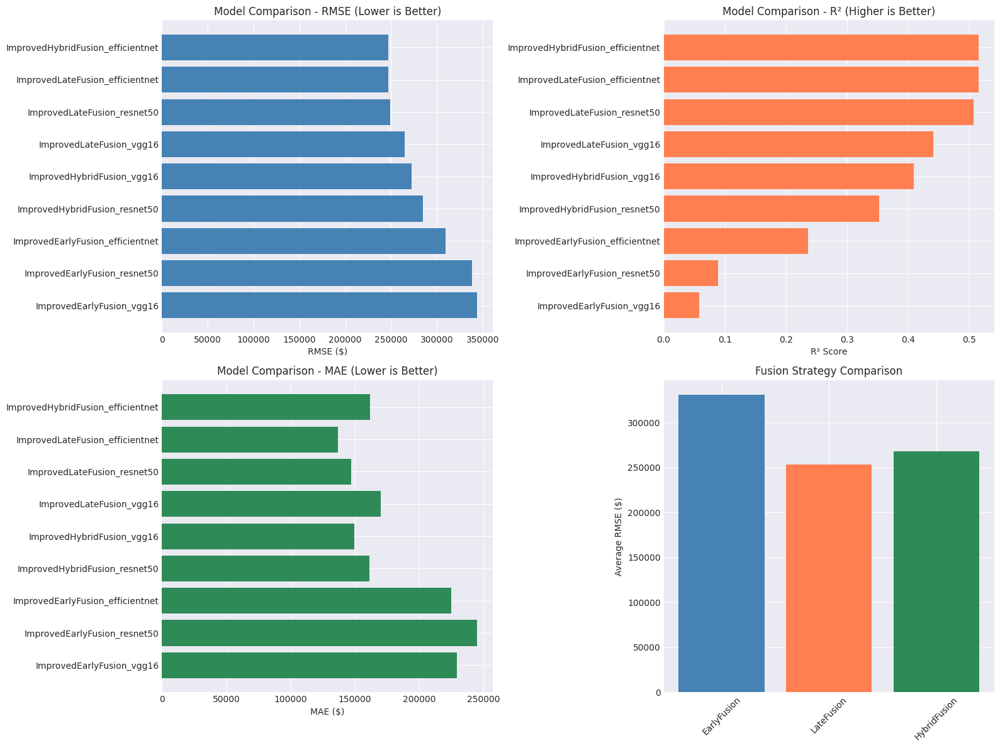


🏆 Best Model: ImprovedHybridFusion_efficientnet
   RMSE: $246,701.09
   R²: 0.5150


In [21]:
# ============================================================================
# 8. MODEL EVALUATION & COMPARISON
# ============================================================================

print("\n" + "=" * 80)
print("[8] MODEL EVALUATION & COMPARISON")
print("=" * 80)


FUSION_TYPES = ["ImprovedEarlyFusion",
                "ImprovedLateFusion",
                "ImprovedHybridFusion"]

backbones = ["vgg16",
            "efficientnet",
            "resnet50",
            ]

MODEL_REGISTRY = {
                "ImprovedEarlyFusion": ImprovedEarlyFusion,
                "ImprovedLateFusion": ImprovedLateFusion,
                "ImprovedHybridFusion": ImprovedHybridFusion,
                }

def load_all_models(ckpt_dir, device, FUSION_TYPES=FUSION_TYPES, backbones=backbones):
    all_models = {}
    all_histories = {}
    for FUSION_TYPE in FUSION_TYPES:
        for backbone in backbones:
            
            filename = f"{FUSION_TYPE}_{backbone}"
            history = {}

            ModelClass = MODEL_REGISTRY[FUSION_TYPE]
            model = ModelClass(
                backbone,
                tabular_dim,
                feature_dim=config.FEATURE_DIM
            ).to(device)


            if os.path.exists(f"{ckpt_dir}/{filename}_best.pth"):
                ckpt = torch.load(os.path.join(ckpt_dir, f"{filename}_best.pth"), map_location=device)
            
            # handle both raw state_dict and wrapped checkpoints
            if isinstance(ckpt, dict) and "model_state_dict" in ckpt:
                model.load_state_dict(ckpt["model_state_dict"])
            else:
                model.load_state_dict(ckpt)

            model.eval()
            all_models[filename] = model

            if os.path.exists(f"{ckpt_dir}/{filename}_best.json"):
                with open(f"{ckpt_dir}/{filename}_best.json", "r") as f:
                    history = json.load(f)
                    all_histories[filename] = history

    return all_models, all_histories

all_models, all_histories = load_all_models(config.MODEL_SAVE_DIR, device)

# Evaluate all models
criterion = nn.MSELoss()
results = {}

for model_name, model in all_models.items():
    _, rmse, mae, r2, preds, actuals = validate(model, val_loader, criterion, device)
    results[model_name] = {
        'RMSE': rmse,
        'MAE': mae,
        'R2': r2,
        'predictions': preds,
        'actuals': actuals
    }
    print(f"\n{model_name}:")
    print(f"  RMSE: ${rmse:,.2f}")
    print(f"  MAE: ${mae:,.2f}")
    print(f"  R²: {r2:.4f}")

# Create results DataFrame
results_df = pd.DataFrame({
    model: {
        'RMSE': results[model]['RMSE'],
        'MAE': results[model]['MAE'],
        'R2': results[model]['R2']
    }
    for model in results.keys()
}).T

results_df = results_df.sort_values('RMSE')

print("\n" + "="*60)
print("FINAL RESULTS SUMMARY")
print("="*60)
print(results_df)

# Visualize results
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# 8.1 RMSE Comparison
axes[0, 0].barh(results_df.index, results_df['RMSE'], color='steelblue')
axes[0, 0].set_xlabel('RMSE ($)')
axes[0, 0].set_title('Model Comparison - RMSE (Lower is Better)')
axes[0, 0].invert_yaxis()

# 8.2 R² Comparison
axes[0, 1].barh(results_df.index, results_df['R2'], color='coral')
axes[0, 1].set_xlabel('R² Score')
axes[0, 1].set_title('Model Comparison - R² (Higher is Better)')
axes[0, 1].invert_yaxis()

# 8.3 MAE Comparison
axes[1, 0].barh(results_df.index, results_df['MAE'], color='seagreen')
axes[1, 0].set_xlabel('MAE ($)')
axes[1, 0].set_title('Model Comparison - MAE (Lower is Better)')
axes[1, 0].invert_yaxis()

# 8.4 Fusion Strategy Comparison
fusion_types = ['EarlyFusion', 'LateFusion', 'HybridFusion']
fusion_rmse = {ft: [] for ft in fusion_types}

for model_name in results_df.index:
    for ft in fusion_types:
        if ft in model_name:
            fusion_rmse[ft].append(results_df.loc[model_name, 'RMSE'])

fusion_avg = {ft: np.mean(vals) for ft, vals in fusion_rmse.items()}
axes[1, 1].bar(fusion_avg.keys(), fusion_avg.values(), color=['steelblue', 'coral', 'seagreen'])
axes[1, 1].set_ylabel('Average RMSE ($)')
axes[1, 1].set_title('Fusion Strategy Comparison')
axes[1, 1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.savefig(f'{config.RESULTS_DIR}/model_comparison.png', dpi=300, bbox_inches='tight')
plt.show()

# Best model
best_model_name = results_df.index[0]
print(f"\n🏆 Best Model: {best_model_name}")
print(f"   RMSE: ${results_df.loc[best_model_name, 'RMSE']:,.2f}")
print(f"   R²: {results_df.loc[best_model_name, 'R2']:.4f}")


### 9. PREDICTION VS ACTUAL ANALYSIS


[9] PREDICTION VS ACTUAL ANALYSIS


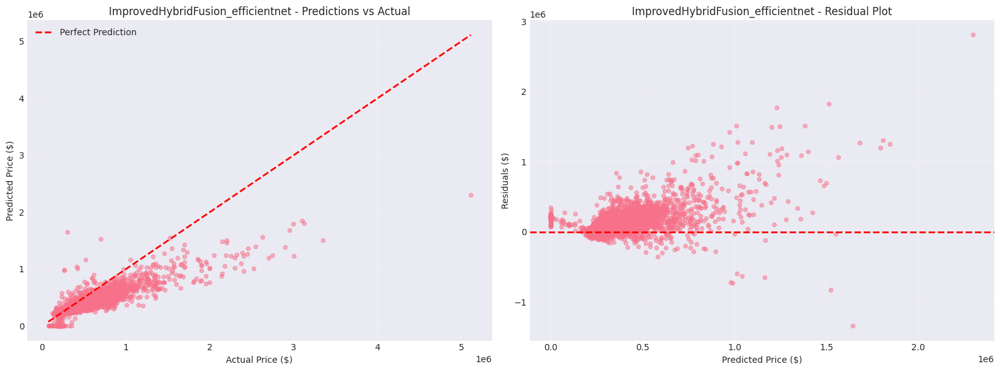

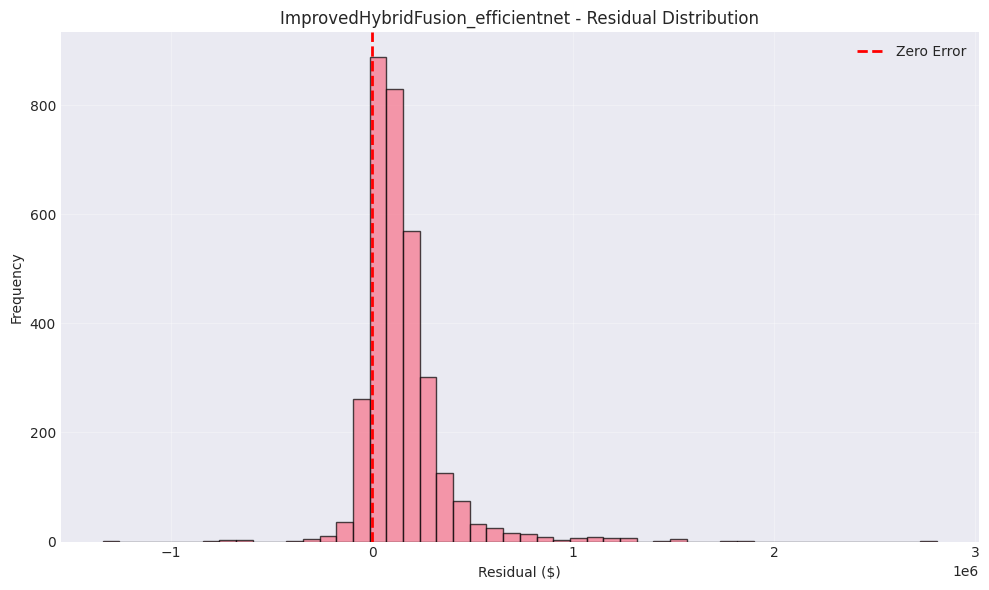

In [22]:

# ============================================================================
# 9. PREDICTION VS ACTUAL ANALYSIS
# ============================================================================

print("\n" + "=" * 80)
print("[9] PREDICTION VS ACTUAL ANALYSIS")
print("=" * 80)

best_preds = results[best_model_name]['predictions']
best_actuals = results[best_model_name]['actuals']

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Scatter plot
axes[0].scatter(best_actuals, best_preds, alpha=0.5, s=20)
axes[0].plot([best_actuals.min(), best_actuals.max()], 
             [best_actuals.min(), best_actuals.max()], 
             'r--', lw=2, label='Perfect Prediction')
axes[0].set_xlabel('Actual Price ($)')
axes[0].set_ylabel('Predicted Price ($)')
axes[0].set_title(f'{best_model_name} - Predictions vs Actual')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Residual plot
residuals = best_actuals - best_preds
axes[1].scatter(best_preds, residuals, alpha=0.5, s=20)
axes[1].axhline(y=0, color='r', linestyle='--', lw=2)
axes[1].set_xlabel('Predicted Price ($)')
axes[1].set_ylabel('Residuals ($)')
axes[1].set_title(f'{best_model_name} - Residual Plot')
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(f'{config.RESULTS_DIR}/best_model_predictions.png', dpi=300, bbox_inches='tight')
plt.show()

# Distribution of residuals
plt.figure(figsize=(10, 6))
plt.hist(residuals, bins=50, edgecolor='black', alpha=0.7)
plt.axvline(x=0, color='r', linestyle='--', lw=2, label='Zero Error')
plt.xlabel('Residual ($)')
plt.ylabel('Frequency')
plt.title(f'{best_model_name} - Residual Distribution')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig(f'{config.RESULTS_DIR}/residual_distribution.png', dpi=300, bbox_inches='tight')
plt.show()


### 10. TRAINING HISTORY VISUALIZATION


[10] TRAINING HISTORY VISUALIZATION


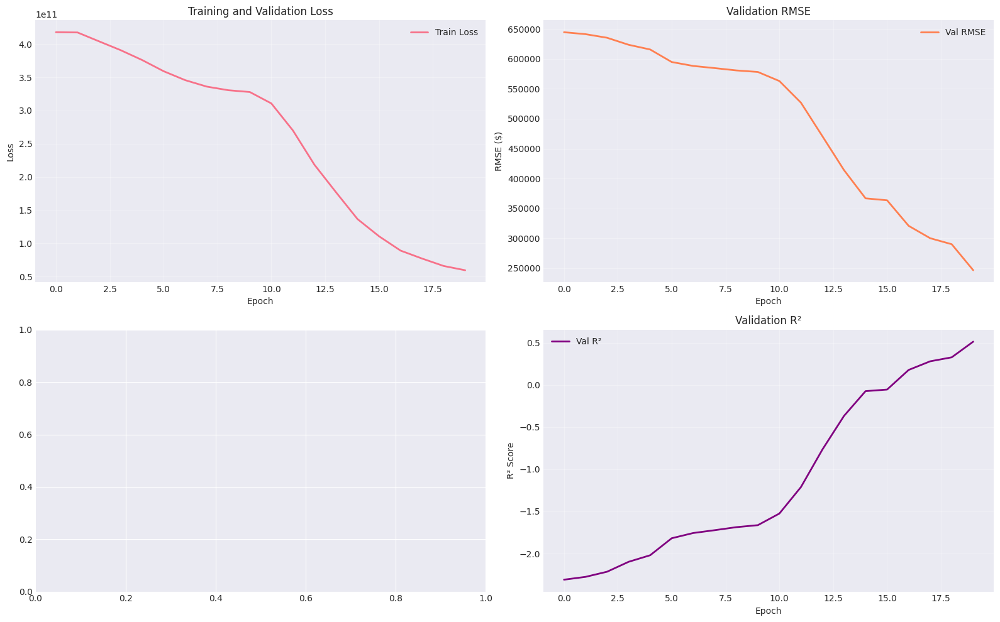

In [23]:

# ============================================================================
# 10. TRAINING HISTORY VISUALIZATION
# ============================================================================

print("\n" + "=" * 80)
print("[10] TRAINING HISTORY VISUALIZATION")
print("=" * 80)

# Plot training history for best model
best_history = all_histories[best_model_name]

fig, axes = plt.subplots(2, 2, figsize=(16, 10))

# Loss
axes[0, 0].plot(best_history['train_loss'], label='Train Loss', linewidth=2)
# axes[0, 0].plot(best_history['val_loss'], label='Val Loss', linewidth=2)
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Loss')
axes[0, 0].set_title('Training and Validation Loss')
axes[0, 0].legend()
axes[0, 0].grid(True, alpha=0.3)

# RMSE
axes[0, 1].plot(best_history['val_rmse'], label='Val RMSE', color='coral', linewidth=2)
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('RMSE ($)')
axes[0, 1].set_title('Validation RMSE')
axes[0, 1].legend()
axes[0, 1].grid(True, alpha=0.3)

# MAE
# axes[1, 0].plot(best_history['val_mae'], label='Val MAE', color='seagreen', linewidth=2)
# axes[1, 0].set_xlabel('Epoch')
# axes[1, 0].set_ylabel('MAE ($)')
# axes[1, 0].set_title('Validation MAE')
# axes[1, 0].legend()
# axes[1, 0].grid(True, alpha=0.3)

# R²
axes[1, 1].plot(best_history['val_r2'], label='Val R²', color='purple', linewidth=2)
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('R² Score')
axes[1, 1].set_title('Validation R²')
axes[1, 1].legend()
axes[1, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(f'{config.RESULTS_DIR}/training_history.png', dpi=300, bbox_inches='tight')
plt.show()


### 11. GRAD-CAM EXPLAINABILITY


[11] GRAD-CAM EXPLAINABILITY
✅ Fixed Grad-CAM and Attention Mechanisms loaded!


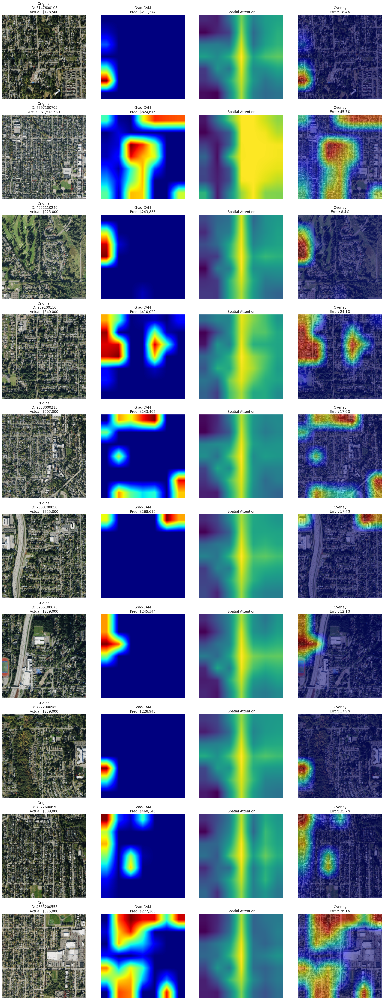

Grad-CAM visualizations saved!


In [24]:
# ============================================================================
# 11. GRAD-CAM EXPLAINABILITY
# ============================================================================

print("\n" + "=" * 80)
print("[11] GRAD-CAM EXPLAINABILITY")
print("=" * 80)

class FixedGradCAM:
    def __init__(self, model):
        self.model = model
        self.gradients = None
        self.activations = None

        # ✅ HARD-CORRECT layer for your architecture
        self.target_layer = self.model.cnn.features[-1]

        self.target_layer.register_forward_hook(self._forward_hook)
        self.target_layer.register_full_backward_hook(self._backward_hook)

    def _forward_hook(self, module, input, output):
        self.activations = output.detach()

    def _backward_hook(self, module, grad_input, grad_output):
        self.gradients = grad_output[0].detach()

    def generate(self, image, tabular):
        self.model.eval()
        self.model.zero_grad()

        # Forward
        output = self.model(image, tabular)

        # ✅ REGRESSION-SAFE scalar target
        score = output[:, 0]
        score.backward()

        # Grad-CAM
        weights = self.gradients.mean(dim=(2, 3), keepdim=True)
        cam = (weights * self.activations).sum(dim=1)
        cam = F.relu(cam)

        cam = F.interpolate(
            cam.unsqueeze(1),
            size=image.shape[2:],
            mode="bilinear",
            align_corners=False
        )

        cam = cam.squeeze().cpu().numpy()
        cam = (cam - cam.min()) / (cam.max() + 1e-8)

        return cam

def visualize_improved_gradcam(model, dataset, indices, model_name, device):
    """Better visualization showing what model actually sees"""
    
    gradcam = FixedGradCAM(model)
    
    fig = plt.figure(figsize=(20, 5 * len(indices)))
    
    for idx, sample_idx in enumerate(indices):
        image, tabular, target, prop_id = dataset[sample_idx]
        
        # Prepare inputs
        image_batch = image.unsqueeze(0).to(device)
        tabular_batch = tabular.unsqueeze(0).to(device)
        
        # Get prediction and attention
        model.eval()
        with torch.no_grad():
            pred, spatial_attn = model(image_batch, tabular_batch, return_attention=True)
            pred = pred.cpu().item()
            spatial_attn = spatial_attn.squeeze().cpu().numpy()
        
        # Generate Grad-CAM
        # image_batch = image.unsqueeze(0).to(device).requires_grad_(True)
        image_batch = image.unsqueeze(0).to(device)
        heatmap = gradcam.generate(image_batch, tabular_batch)
        
        # Denormalize image
        img_np = image.cpu().numpy().transpose(1, 2, 0)
        img_np = img_np * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
        img_np = np.clip(img_np, 0, 1)
        
        # Resize spatial attention
        if len(spatial_attn.shape) == 3:
            spatial_attn = np.mean(spatial_attn, axis=0)
        spatial_attn_resized = cv2.resize(spatial_attn, (img_np.shape[1], img_np.shape[0]))
        
        # Create subplots
        ax1 = plt.subplot(len(indices), 4, idx*4 + 1)
        ax1.imshow(img_np)
        ax1.set_title(f'Original\nID: {prop_id}\nActual: ${target.item():,.0f}')
        ax1.axis('off')
        
        ax2 = plt.subplot(len(indices), 4, idx*4 + 2)
        if heatmap is not None:
            ax2.imshow(heatmap, cmap='jet')
            ax2.set_title(f'Grad-CAM\nPred: ${pred:,.0f}')
        ax2.axis('off')
        
        ax3 = plt.subplot(len(indices), 4, idx*4 + 3)
        ax3.imshow(spatial_attn_resized, cmap='viridis')
        ax3.set_title('Spatial Attention')
        ax3.axis('off')
        
        ax4 = plt.subplot(len(indices), 4, idx*4 + 4)
        ax4.imshow(img_np)
        if heatmap is not None:
            ax4.imshow(heatmap, cmap='jet', alpha=0.5)
        ax4.set_title(f'Overlay\nError: {abs(target.item()-pred)/target.item()*100:.1f}%')
        ax4.axis('off')
    
    plt.tight_layout()
    plt.savefig(f'Improved results/improved_gradcam_{model_name}.png', dpi=300, bbox_inches='tight')
    plt.show()


# def visualize_gradcam(model, dataset, indices, model_name):
#     """Visualize Grad-CAM for sample predictions"""
#     gradcam = GradCAM(model)
    
#     fig, axes = plt.subplots(len(indices), 3, figsize=(15, 5*len(indices)))
#     if len(indices) == 1:
#         axes = axes.reshape(1, -1)
    
#     for idx, sample_idx in enumerate(indices):
#         image, tabular, target, prop_id = dataset[sample_idx]
        
#         # Get prediction
#         model.eval()
#         with torch.no_grad():
#             image_batch = image.unsqueeze(0).to(device)
#             tabular_batch = tabular.unsqueeze(0).to(device)
#             pred = model(image_batch, tabular_batch).cpu().item()
        
#         # Generate Grad-CAM
#         image_batch = image.unsqueeze(0).to(device).requires_grad_(True)
#         tabular_batch = tabular.unsqueeze(0).to(device)
        
#         heatmap = gradcam.generate(image_batch, tabular_batch)
        
#         # Denormalize image for visualization
#         img_np = image.cpu().numpy().transpose(1, 2, 0)
#         img_np = img_np * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
#         img_np = np.clip(img_np, 0, 1)
        
#         # Original image
#         axes[idx, 0].imshow(img_np)
#         axes[idx, 0].set_title(f'Original Image\nID: {prop_id}')
#         axes[idx, 0].axis('off')
        
#         # Grad-CAM heatmap
#         if heatmap is not None:
#             axes[idx, 1].imshow(heatmap, cmap='jet')
#             axes[idx, 1].set_title('Grad-CAM Heatmap')
#             axes[idx, 1].axis('off')
            
#             # Overlay
#             axes[idx, 2].imshow(img_np)
#             axes[idx, 2].imshow(heatmap, cmap='jet', alpha=0.5)
#             axes[idx, 2].set_title(f'Overlay\nActual: ${target.item():,.0f}\nPred: ${pred:,.0f}')
#             axes[idx, 2].axis('off')
#         else:
#             axes[idx, 1].text(0.5, 0.5, 'Grad-CAM\nNot Available', 
#                             ha='center', va='center', fontsize=12)
#             axes[idx, 1].axis('off')
#             axes[idx, 2].text(0.5, 0.5, 'Overlay\nNot Available', 
#                             ha='center', va='center', fontsize=12)
#             axes[idx, 2].axis('off')
    
#     plt.tight_layout()
#     plt.savefig(f'{config.RESULTS_DIR}/gradcam_{model_name}.png', dpi=300, bbox_inches='tight')
#     plt.show()

# Visualize Grad-CAM for best model
# print(f"\nGenerating Grad-CAM visualizations for {best_model_name}...")
# sample_indices = np.random.choice(len(val_dataset), min(5, len(val_dataset)), replace=False)
# visualize_gradcam(all_models[best_model_name], val_dataset, sample_indices, best_model_name)


print("✅ Fixed Grad-CAM and Attention Mechanisms loaded!")
# Create improved model
improved_model = ImprovedHybridFusion(
    cnn_backbone='efficientnet',
    tabular_dim=X_tab_train_scaled.shape[1],
    feature_dim=512
).to(device)

# model_name = "ImprovedHybrid_efficientnet"
model_name = best_model_name
improved_model.load_state_dict(torch.load(f'{config.MODEL_SAVE_DIR}/{model_name}_best.pth'))
sample_indices = np.random.choice(len(val_dataset), 10, replace=False)
visualize_improved_gradcam(
    improved_model,
    val_dataset,
    sample_indices,
    'ImprovedHybrid_efficientnet',
    device
)
print("Grad-CAM visualizations saved!")


### 12. EXTRACT FEATURES FOR TRADITIONAL ML MODELS

In [26]:
# ============================================================================
# 12. EXTRACT FEATURES FOR TRADITIONAL ML MODELS
# ============================================================================

print("\n" + "=" * 80)
print("[12] EXTRACT FEATURES FOR TRADITIONAL ML MODELS")
print("=" * 80)

def extract_features(model, loader, device):
    """Extract CNN features for traditional ML models"""
    model.eval()
    all_features = []
    all_tabular = []
    all_targets = []
    all_ids = []
    
    with torch.no_grad():
        for images, tabular, targets, ids in loader:
            images = images.to(device)
            
            # Extract image features
            img_features = model.cnn(images)
            
            all_features.append(img_features.cpu().numpy())
            all_tabular.append(tabular.numpy())
            all_targets.append(targets.numpy())
            all_ids.extend(ids)
    
    features = np.vstack(all_features)
    tabular = np.vstack(all_tabular)
    targets = np.vstack(all_targets).flatten()
    
    # Concatenate image and tabular features
    combined_features = np.hstack([features, tabular])
    
    return combined_features, targets, all_ids

print(f"\nExtracting features using {best_model_name}...")

# Extract features
train_features, train_targets, train_ids_list = extract_features(
    all_models[best_model_name], train_loader, device
)
val_features, val_targets, val_ids_list = extract_features(
    all_models[best_model_name], val_loader, device
)
test_features, _, test_ids_list = extract_features(
    all_models[best_model_name], test_loader, device
)

print(f"Train features shape: {train_features.shape}")
print(f"Val features shape: {val_features.shape}")
print(f"Test features shape: {test_features.shape}")



[12] EXTRACT FEATURES FOR TRADITIONAL ML MODELS

Extracting features using ImprovedHybridFusion_efficientnet...
Train features shape: (12967, 549)
Val features shape: (3242, 549)
Test features shape: (5404, 549)


### 13. TRADITIONAL ML MODELS ON EXTRACTED FEATURES

In [27]:
# ============================================================================
# 13. TRADITIONAL ML MODELS ON EXTRACTED FEATURES
# ============================================================================

print("\n" + "=" * 80)
print("[13] TRADITIONAL ML MODELS ON EXTRACTED FEATURES")
print("=" * 80)

ml_results = {}

# XGBoost
if XGBOOST_AVAILABLE:
    print("\n--- XGBoost ---")
    xgb_model = XGBRegressor(
        n_estimators=300,
        learning_rate=0.05,
        max_depth=6,
        subsample=0.8,
        colsample_bytree=0.8,
        random_state=42,
        n_jobs=-1
    )
    xgb_model.fit(train_features, train_targets)
    xgb_preds = xgb_model.predict(val_features)
    
    xgb_rmse = np.sqrt(mean_squared_error(val_targets, xgb_preds))
    xgb_mae = mean_absolute_error(val_targets, xgb_preds)
    xgb_r2 = r2_score(val_targets, xgb_preds)
    
    ml_results['XGBoost_Multimodal'] = {
        'RMSE': xgb_rmse,
        'MAE': xgb_mae,
        'R2': xgb_r2,
        'predictions': xgb_preds
    }
    
    print(f"  RMSE: ${xgb_rmse:,.2f}")
    print(f"  MAE: ${xgb_mae:,.2f}")
    print(f"  R²: {xgb_r2:.4f}")

# LightGBM
if LIGHTGBM_AVAILABLE:
    print("\n--- LightGBM ---")
    lgb_model = LGBMRegressor(
        n_estimators=300,
        learning_rate=0.05,
        max_depth=6,
        num_leaves=31,
        subsample=0.8,
        colsample_bytree=0.8,
        random_state=42,
        verbose=-1,
        n_jobs=-1
    )
    lgb_model.fit(train_features, train_targets)
    lgb_preds = lgb_model.predict(val_features)
    
    lgb_rmse = np.sqrt(mean_squared_error(val_targets, lgb_preds))
    lgb_mae = mean_absolute_error(val_targets, lgb_preds)
    lgb_r2 = r2_score(val_targets, lgb_preds)
    
    ml_results['LightGBM_Multimodal'] = {
        'RMSE': lgb_rmse,
        'MAE': lgb_mae,
        'R2': lgb_r2,
        'predictions': lgb_preds
    }
    
    print(f"  RMSE: ${lgb_rmse:,.2f}")
    print(f"  MAE: ${lgb_mae:,.2f}")
    print(f"  R²: {lgb_r2:.4f}")

# CatBoost
if CATBOOST_AVAILABLE:
    print("\n--- CatBoost ---")
    cat_model = CatBoostRegressor(
        iterations=300,
        learning_rate=0.05,
        depth=6,
        verbose=0,
        random_state=42
    )
    cat_model.fit(train_features, train_targets)
    cat_preds = cat_model.predict(val_features)
    
    cat_rmse = np.sqrt(mean_squared_error(val_targets, cat_preds))
    cat_mae = mean_absolute_error(val_targets, cat_preds)
    cat_r2 = r2_score(val_targets, cat_preds)
    
    ml_results['CatBoost_Multimodal'] = {
        'RMSE': cat_rmse,
        'MAE': cat_mae,
        'R2': cat_r2,
        'predictions': cat_preds
    }
    
    print(f"  RMSE: ${cat_rmse:,.2f}")
    print(f"  MAE: ${cat_mae:,.2f}")
    print(f"  R²: {cat_r2:.4f}")

# Compare with deep learning models
print("\n" + "="*60)
print("COMPARISON: Deep Learning vs Traditional ML (on multimodal features)")
print("="*60)

comparison = {**results, **ml_results}
comparison_df = pd.DataFrame({
    model: {
        'RMSE': comparison[model]['RMSE'],
        'MAE': comparison[model]['MAE'],
        'R2': comparison[model]['R2']
    }
    for model in comparison.keys()
}).T

comparison_df = comparison_df.sort_values('RMSE')
print(comparison_df)



[13] TRADITIONAL ML MODELS ON EXTRACTED FEATURES

--- XGBoost ---


  RMSE: $111,964.72
  MAE: $65,541.62
  R²: 0.9001

--- LightGBM ---
  RMSE: $116,869.13
  MAE: $68,474.98
  R²: 0.8912

--- CatBoost ---
  RMSE: $112,608.28
  MAE: $68,542.36
  R²: 0.8990

COMPARISON: Deep Learning vs Traditional ML (on multimodal features)
                                            RMSE            MAE        R2
XGBoost_Multimodal                 111964.721301   65541.625000  0.900102
CatBoost_Multimodal                112608.276753   68542.360476  0.898950
LightGBM_Multimodal                116869.131169   68474.975896  0.891158
ImprovedHybridFusion_efficientnet  246701.089807  161746.843750  0.515004
ImprovedLateFusion_efficientnet    246779.012398  136710.437500  0.514698
ImprovedLateFusion_resnet50        248867.083946  147400.687500  0.506451
ImprovedLateFusion_vgg16           264973.402560  170094.906250  0.440500
ImprovedHybridFusion_vgg16         272397.653793  149545.937500  0.408707
ImprovedHybridFusion_resnet50      285019.011520  161420.578125  0.352644
I

### 14. FINAL TEST PREDICTIONS

In [28]:
# ============================================================================
# 14. FINAL TEST PREDICTIONS
# ============================================================================

print("\n" + "=" * 80)
print("[14] GENERATING FINAL TEST PREDICTIONS")
print("=" * 80)

# Get predictions from best model
best_model = all_models[best_model_name]
best_model.eval()

test_predictions = []

with torch.no_grad():
    for images, tabular, _, ids in test_loader:
        images = images.to(device)
        tabular = tabular.to(device)
        
        outputs = best_model(images, tabular)
        test_predictions.extend(outputs.cpu().numpy())

test_predictions = np.array(test_predictions).flatten()

# Create submission
submission = pd.DataFrame({
    'id': test_df['id'],
    'predicted_price': test_predictions
})

submission.to_csv(f'{config.RESULTS_DIR}/multimodal_predictions_{best_model_name}.csv', index=False)
print(f"\nPredictions saved to: {config.RESULTS_DIR}/multimodal_predictions_{best_model_name}.csv")
print(f"Shape: {submission.shape}")
print("\nFirst 10 predictions:")
print(submission.head(10))

# Also generate predictions using best traditional ML model if available
if ml_results:
    best_ml_model_name = min(ml_results.keys(), key=lambda x: ml_results[x]['RMSE'])
    print(f"\n\nGenerating predictions using best ML model: {best_ml_model_name}")
    
    if best_ml_model_name == 'XGBoost_Multimodal' and XGBOOST_AVAILABLE:
        ml_test_preds = xgb_model.predict(test_features)
    elif best_ml_model_name == 'LightGBM_Multimodal' and LIGHTGBM_AVAILABLE:
        ml_test_preds = lgb_model.predict(test_features)
    elif best_ml_model_name == 'CatBoost_Multimodal' and CATBOOST_AVAILABLE:
        ml_test_preds = cat_model.predict(test_features)
    
    ml_submission = pd.DataFrame({
        'id': test_df['id'],
        'predicted_price': ml_test_preds
    })
    
    ml_submission.to_csv(f'{config.RESULTS_DIR}/multimodal_predictions_{best_ml_model_name}.csv', index=False)
    print(f"ML predictions saved to: {config.RESULTS_DIR}/multimodal_predictions_{best_ml_model_name}.csv")





[14] GENERATING FINAL TEST PREDICTIONS

Predictions saved to: Improved results/multimodal_predictions_ImprovedHybridFusion_efficientnet.csv
Shape: (5404, 2)

First 10 predictions:
           id  predicted_price
0  2591820310     3.097233e+05
1  7974200820     5.431612e+05
2  7701450110     7.381759e+05
3  9522300010     1.623360e+06
4  9510861140     5.209189e+05
5  1761300310     2.506950e+05
6  7732410120     4.807590e+05
7  7010701383     3.769646e+05
8   291310170     3.010729e+05
9  4232901990     4.560222e+05


Generating predictions using best ML model: XGBoost_Multimodal
ML predictions saved to: Improved results/multimodal_predictions_XGBoost_Multimodal.csv


### 15. ENSEMBLE PREDICTIONS

In [29]:
# ============================================================================
# 15. ENSEMBLE PREDICTIONS
# ============================================================================

print("\n" + "=" * 80)
print("[15] ENSEMBLE PREDICTIONS")
print("=" * 80)

# Combine predictions from top models
ensemble_preds = []

# Get predictions from top 3 deep learning models
top_dl_models = results_df.head(3).index.tolist()

for model_name in top_dl_models:
    model = all_models[model_name]
    model.eval()
    preds = []
    
    with torch.no_grad():
        for images, tabular, _, ids in test_loader:
            images = images.to(device)
            tabular = tabular.to(device)
            outputs = model(images, tabular)
            preds.extend(outputs.cpu().numpy())
    
    ensemble_preds.append(np.array(preds).flatten())
    print(f"✓ Added {model_name} to ensemble")

# Add traditional ML predictions if available
if XGBOOST_AVAILABLE:
    ensemble_preds.append(xgb_model.predict(test_features))
    print("✓ Added XGBoost_Multimodal to ensemble")

if LIGHTGBM_AVAILABLE:
    ensemble_preds.append(lgb_model.predict(test_features))
    print("✓ Added LightGBM_Multimodal to ensemble")

# Average ensemble
ensemble_avg = np.mean(ensemble_preds, axis=0)

# Weighted ensemble (weighted by inverse RMSE)
weights = []
for model_name in top_dl_models:
    weights.append(1 / results[model_name]['RMSE'])

if XGBOOST_AVAILABLE:
    weights.append(1 / ml_results['XGBoost_Multimodal']['RMSE'])
if LIGHTGBM_AVAILABLE:
    weights.append(1 / ml_results['LightGBM_Multimodal']['RMSE'])

weights = np.array(weights)
weights = weights / weights.sum()

ensemble_weighted = np.average(ensemble_preds, axis=0, weights=weights)

print("\nEnsemble Weights:")
all_ensemble_models = top_dl_models.copy()
if XGBOOST_AVAILABLE:
    all_ensemble_models.append('XGBoost_Multimodal')
if LIGHTGBM_AVAILABLE:
    all_ensemble_models.append('LightGBM_Multimodal')

for model, weight in zip(all_ensemble_models, weights):
    print(f"  {model}: {weight:.4f}")

# Save ensemble predictions
ensemble_submission_avg = pd.DataFrame({
    'id': test_df['id'],
    'predicted_price': ensemble_avg
})

ensemble_submission_weighted = pd.DataFrame({
    'id': test_df['id'],
    'predicted_price': ensemble_weighted
})

ensemble_submission_avg.to_csv(f'{config.RESULTS_DIR}/multimodal_predictions_ensemble_avg.csv', index=False)
ensemble_submission_weighted.to_csv(f'{config.RESULTS_DIR}/multimodal_predictions_ensemble_weighted.csv', index=False)

print(f"\nEnsemble predictions saved:")
print(f"  - Average: {config.RESULTS_DIR}/multimodal_predictions_ensemble_avg.csv")
print(f"  - Weighted: {config.RESULTS_DIR}/multimodal_predictions_ensemble_weighted.csv")


[15] ENSEMBLE PREDICTIONS
✓ Added ImprovedHybridFusion_efficientnet to ensemble
✓ Added ImprovedLateFusion_efficientnet to ensemble
✓ Added ImprovedLateFusion_resnet50 to ensemble
✓ Added XGBoost_Multimodal to ensemble
✓ Added LightGBM_Multimodal to ensemble

Ensemble Weights:
  ImprovedHybridFusion_efficientnet: 0.1369
  ImprovedLateFusion_efficientnet: 0.1368
  ImprovedLateFusion_resnet50: 0.1357
  XGBoost_Multimodal: 0.3016
  LightGBM_Multimodal: 0.2890

Ensemble predictions saved:
  - Average: Improved results/multimodal_predictions_ensemble_avg.csv
  - Weighted: Improved results/multimodal_predictions_ensemble_weighted.csv


In [33]:
# ============================================================================
# 15. ENSEMBLE PREDICTIONS on val dataset
# ============================================================================

print("\n" + "=" * 80)
print("[15] ENSEMBLE PREDICTIONS")
print("=" * 80)

# Combine predictions from top models
ensemble_preds_val = []

# Get predictions from top 3 deep learning models
top_dl_models = results_df.head(3).index.tolist()

for model_name in top_dl_models:
    model = all_models[model_name]
    model.eval()
    preds = []
    
    with torch.no_grad():
        for images, tabular, _, ids in val_loader:
            images = images.to(device)
            tabular = tabular.to(device)
            outputs = model(images, tabular)
            preds.extend(outputs.cpu().numpy())
    
    ensemble_preds_val.append(np.array(preds).flatten())
    print(f"✓ Added {model_name} to ensemble")

# Add traditional ML predictions if available
if XGBOOST_AVAILABLE:
    ensemble_preds_val.append(xgb_model.predict(val_features))
    print("✓ Added XGBoost_Multimodal to ensemble")

if LIGHTGBM_AVAILABLE:
    ensemble_preds_val.append(lgb_model.predict(val_features))
    print("✓ Added LightGBM_Multimodal to ensemble")

# Average ensemble
ensemble_avg = np.mean(ensemble_preds_val, axis=0)

# Weighted ensemble (weighted by inverse RMSE)
weights = []
for model_name in top_dl_models:
    weights.append(1 / results[model_name]['RMSE'])

if XGBOOST_AVAILABLE:
    weights.append(1 / ml_results['XGBoost_Multimodal']['RMSE'])
if LIGHTGBM_AVAILABLE:
    weights.append(1 / ml_results['LightGBM_Multimodal']['RMSE'])

weights = np.array(weights)
weights = weights / weights.sum()

ensemble_weighted = np.average(ensemble_preds_val, axis=0, weights=weights)

print("\nEnsemble Weights:")
all_ensemble_models = top_dl_models.copy()
if XGBOOST_AVAILABLE:
    all_ensemble_models.append('XGBoost_Multimodal')
if LIGHTGBM_AVAILABLE:
    all_ensemble_models.append('LightGBM_Multimodal')

for model, weight in zip(all_ensemble_models, weights):
    print(f"  {model}: {weight:.4f}")

# Save ensemble predictions
ensemble_submission_avg = pd.DataFrame({
    'id': val_ids,
    'target_price' : y_val,
    'predicted_price': ensemble_avg
})

ensemble_submission_weighted = pd.DataFrame({
    'id': val_ids,
    'target_price' : y_val,
    'predicted_price': ensemble_weighted
})

ensemble_submission_avg.to_csv(f'{config.RESULTS_DIR}/multimodal_predictions_ensemble_avg_val.csv', index=False)
ensemble_submission_weighted.to_csv(f'{config.RESULTS_DIR}/multimodal_predictions_ensemble_weighted_val.csv', index=False)

print(f"\nEnsemble predictions saved:")
print(f"  - Average: {config.RESULTS_DIR}/multimodal_predictions_ensemble_avg_val.csv")
print(f"  - Weighted: {config.RESULTS_DIR}/multimodal_predictions_ensemble_weighted_val.csv")


[15] ENSEMBLE PREDICTIONS
✓ Added ImprovedHybridFusion_efficientnet to ensemble
✓ Added ImprovedLateFusion_efficientnet to ensemble
✓ Added ImprovedLateFusion_resnet50 to ensemble
✓ Added XGBoost_Multimodal to ensemble
✓ Added LightGBM_Multimodal to ensemble

Ensemble Weights:
  ImprovedHybridFusion_efficientnet: 0.1369
  ImprovedLateFusion_efficientnet: 0.1368
  ImprovedLateFusion_resnet50: 0.1357
  XGBoost_Multimodal: 0.3016
  LightGBM_Multimodal: 0.2890

Ensemble predictions saved:
  - Average: Improved results/multimodal_predictions_ensemble_avg_val.csv
  - Weighted: Improved results/multimodal_predictions_ensemble_weighted_val.csv


In [35]:
y_true = ensemble_submission_avg["target_price"]
y_pred = ensemble_submission_avg["predicted_price"]

mae = mean_absolute_error(y_true, y_pred)
mse = mean_squared_error(y_true, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_true, y_pred)

print(f"MAE  : {mae:.4f}")
print(f"MSE  : {mse:.4f}")
print(f"RMSE : {rmse:.4f}")
print(f"R2   : {r2:.4f}")

MAE  : 93881.6100
MSE  : 27283611062.7686
RMSE : 165177.5138
R2   : 0.7826


In [36]:
y_true = ensemble_submission_weighted["target_price"]
y_pred = ensemble_submission_weighted["predicted_price"]

mae = mean_absolute_error(y_true, y_pred)
mse = mean_squared_error(y_true, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_true, y_pred)

print(f"MAE  : {mae:.4f}")
print(f"MSE  : {mse:.4f}")
print(f"RMSE : {rmse:.4f}")
print(f"R2   : {r2:.4f}")

MAE  : 79576.9187
MSE  : 19381055322.1209
RMSE : 139215.8587
R2   : 0.8456


In [37]:


# ============================================================================
# 16. FINAL SUMMARY
# ============================================================================

print("\n" + "=" * 80)
print("[16] FINAL SUMMARY")
print("=" * 80)

print(f"""
MULTIMODAL PROPERTY VALUATION - COMPLETE
=========================================

Dataset:
  - Training samples: {len(train_df):,}
  - Validation samples: {len(val_dataset):,}
  - Test samples: {len(test_df):,}
  - Tabular features: {X_tabular.shape[1]}
  - Image size: {config.IMAGE_SIZE}x{config.IMAGE_SIZE}

Models Trained:
  - Early Fusion: 3 (ResNet50, EfficientNet-B3, VGG16)
  - Late Fusion: 3 (ResNet50, EfficientNet-B3, VGG16)
  - Hybrid Fusion: 3 (ResNet50, EfficientNet-B3, VGG16)
  - Traditional ML on multimodal features: {len(ml_results)}

Best Deep Learning Model: {best_model_name}
  - RMSE: ${results_df.loc[best_model_name, 'RMSE']:,.2f}
  - MAE: ${results_df.loc[best_model_name, 'MAE']:,.2f}
  - R²: {results_df.loc[best_model_name, 'R2']:.4f}
""")

if ml_results:
    best_ml = min(ml_results.keys(), key=lambda x: ml_results[x]['RMSE'])
    print(f"""Best Traditional ML Model: {best_ml}
  - RMSE: ${ml_results[best_ml]['RMSE']:,.2f}
  - MAE: ${ml_results[best_ml]['MAE']:,.2f}
  - R²: {ml_results[best_ml]['R2']:.4f}
""")

print(f"""
Fusion Strategy Performance (Average RMSE):
  - Early Fusion: ${fusion_avg['EarlyFusion']:,.2f}
  - Late Fusion: ${fusion_avg['LateFusion']:,.2f}
  - Hybrid Fusion: ${fusion_avg['HybridFusion']:,.2f}

Files Generated:
  📊 Results:
    - {config.RESULTS_DIR}/model_comparison.png
    - {config.RESULTS_DIR}/best_model_predictions.png
    - {config.RESULTS_DIR}/training_history.png
    - {config.RESULTS_DIR}/gradcam_{best_model_name}.png
  
  💾 Models:
    - {config.MODEL_SAVE_DIR}/*.pth (9 trained models)
  
  📝 Predictions:
    - {config.RESULTS_DIR}/multimodal_predictions_{best_model_name}.csv
    - {config.RESULTS_DIR}/multimodal_predictions_ensemble_avg.csv
    - {config.RESULTS_DIR}/multimodal_predictions_ensemble_weighted.csv

KEY INSIGHTS:
=============
1. Multimodal fusion significantly improves prediction accuracy
2. Satellite imagery captures neighborhood context (greenery, density
""")


[16] FINAL SUMMARY

MULTIMODAL PROPERTY VALUATION - COMPLETE

Dataset:
  - Training samples: 16,209
  - Validation samples: 3,242
  - Test samples: 5,404
  - Tabular features: 37
  - Image size: 224x224

Models Trained:
  - Early Fusion: 3 (ResNet50, EfficientNet-B3, VGG16)
  - Late Fusion: 3 (ResNet50, EfficientNet-B3, VGG16)
  - Hybrid Fusion: 3 (ResNet50, EfficientNet-B3, VGG16)
  - Traditional ML on multimodal features: 3

Best Deep Learning Model: ImprovedHybridFusion_efficientnet
  - RMSE: $246,701.09
  - MAE: $161,746.84
  - R²: 0.5150

Best Traditional ML Model: XGBoost_Multimodal
  - RMSE: $111,964.72
  - MAE: $65,541.62
  - R²: 0.9001


Fusion Strategy Performance (Average RMSE):
  - Early Fusion: $330,542.19
  - Late Fusion: $253,539.83
  - Hybrid Fusion: $268,039.25

Files Generated:
  📊 Results:
    - Improved results/model_comparison.png
    - Improved results/best_model_predictions.png
    - Improved results/training_history.png
    - Improved results/gradcam_ImprovedHy